In [74]:
%%bash
set -e

SHARED_DIR="$HOME/shared/fader_network_26/datasets/celeb_a"
IMG_DIR="$SHARED_DIR/images"
ATTR_DIR="$SHARED_DIR/attributes"

echo "Creating file structure..."
mkdir -p "$IMG_DIR" "$ATTR_DIR"

echo ""
echo "Checking current inventory..."

IMG_COUNT=$(find "$IMG_DIR" -type f -iname '*.jpg' 2>/dev/null | wc -l | tr -d ' ')
ATTR_FILE="$ATTR_DIR/list_attr_celeba.txt"

if [ "$IMG_COUNT" -gt 0 ]; then
  echo "Images already present: $IMG_COUNT JPG files"
else
  echo "No images found yet in: $IMG_DIR"
  echo "Action needed:"
  echo "   1) Download CelebA 'Aligned & Cropped' (img_align_celeba.zip) from the official page."
  echo "   2) Put the ZIP here:"
  echo "      $SHARED_DIR/img_align_celeba.zip"
  echo "   OR put the extracted folder here:"
  echo "      $IMG_DIR/img_align_celeba/"
fi

if [ -f "$ATTR_FILE" ]; then
  echo "Attributes file present: $ATTR_FILE"
else
  echo "Attributes file missing."
  echo "Action needed:"
  echo "   Copy list_attr_celeba.txt into:"
  echo "      $ATTR_DIR/"
fi

# If zip is present, extract it (idempotent-ish)
ZIP_PATH="$SHARED_DIR/images/img_align_celeba.zip"
if [ -f "$ZIP_PATH" ] && [ "$IMG_COUNT" -eq 0 ]; then
  echo ""
  echo "Found zip: $ZIP_PATH"
  echo "Extracting into $IMG_DIR ..."

  # Ensure unzip exists
  if ! command -v unzip >/dev/null 2>&1; then
    echo "ERROR: unzip is not installed. Install it (apt-get install unzip) or extract zip manually."
    exit 1
  fi

  unzip -q -n "$ZIP_PATH" -d "$IMG_DIR"
  echo "Extraction done."
fi

# Recompute count after potential extraction
FINAL_IMG=$(find "$IMG_DIR" -type f -iname '*.jpg' 2>/dev/null | wc -l | tr -d ' ')
FINAL_ATTR=0
if [ -f "$ATTR_FILE" ]; then FINAL_ATTR=1; fi

echo ""
echo "=" | awk '{printf "%80s\n", $0}' | tr ' =' '='
echo "Inventory"
echo "=" | awk '{printf "%80s\n", $0}' | tr ' =' '='
echo "Images (.jpg)          : $FINAL_IMG / 202599"
echo "list_attr_celeba.txt   : $FINAL_ATTR / 1"
echo ""
echo "Complete path: $(realpath "$SHARED_DIR")"
echo "=" | awk '{printf "%80s\n", $0}' | tr ' =' '='


Creating file structure...

Checking current inventory...
Images already present: 405199 JPG files
Attributes file present: /home/ray/shared/fader_network_26/datasets/celeb_a/attributes/list_attr_celeba.txt

Inventory
Images (.jpg)          : 405199 / 202599
list_attr_celeba.txt   : 1 / 1

Complete path: /srv/shared/fader_network_26/datasets/celeb_a


In [75]:
import random, matplotlib.pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
from tqdm.auto import tqdm
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from models import Encoder, Decoder, Discriminator
from loss_functions import *
import importlib
import os
import numpy as np
import re
import pandas as pd
import random
import torch.optim as optim
from torchvision import transforms
from tqdm import tqdm

from pathlib import Path
from PIL import Image
from models import *
from loss_functions import *


torch.manual_seed(0)

device = "cuda" if torch.cuda.is_available() else "cpu"
print("Device:", device)

#Important directories
BASE_DIR = Path.home() / "shared" / "fader_network_26" / "datasets" / "celeb_a"
IMG_DIR = BASE_DIR / "images" / "img_align_celeba"
ATTR_DIR = BASE_DIR / "attributes" / "list_attr_celeba.txt"

Device: cuda


In [76]:
def load_celeba_attributes(attr_path):
    with open(attr_path, "r") as f:
        lines = f.readlines()

    n_images = int(lines[0].strip())
    attr_names = lines[1].strip().split()

    attr_dict = {}
    for line in lines[2:]:
        parts = line.strip().split()
        filename = parts[0]
        values = list(map(int, parts[1:]))

        attr_dict[filename] = dict(
            zip(attr_names, values)
        )

    return attr_names, attr_dict

attr_names, attr_dict = load_celeba_attributes(ATTR_DIR)

print(f"{len(attr_names)} attributes loaded")
print(f"{len(attr_dict)} images loaded")

40 attributes loaded
202599 images loaded


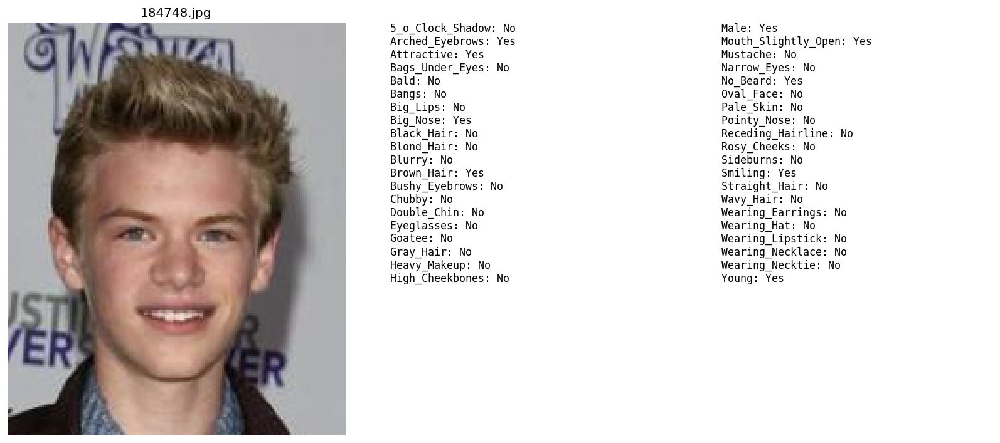

Image size : 
(178, 218)


'184748.jpg'

In [77]:
def show_random_celeba_sample(attr_dict, max_attrs_per_col=20):
    # --- pick random file from attr_dict ---
    filename = random.choice(list(attr_dict.keys()))
    img_path = os.path.join(IMG_DIR, filename)

    # --- load image ---
    img = Image.open(img_path).convert("RGB")

    # --- attributes (sorted for stability) ---
    attrs = attr_dict[filename]
    items = [(k, "Yes" if v == 1 else "No") for k, v in attrs.items()]

    # split into 2 columns of text if too many lines
    left = items[:max_attrs_per_col]
    right = items[max_attrs_per_col:]

    text_left = "\n".join([f"{k}: {v}" for k, v in left])
    text_right = "\n".join([f"{k}: {v}" for k, v in right])

    # --- plot: image + text ---
    fig = plt.figure(figsize=(14, 6), dpi=120)
    gs = fig.add_gridspec(1, 2, width_ratios=[1, 1.4])

    ax_img = fig.add_subplot(gs[0, 0])
    ax_txt = fig.add_subplot(gs[0, 1])

    ax_img.imshow(img)
    ax_img.axis("off")
    ax_img.set_title(filename, fontsize=12)

    ax_txt.axis("off")
    ax_txt.text(0.00, 1.00, text_left, va="top", ha="left", fontsize=10, family="monospace")
    if right:
        ax_txt.text(0.55, 1.00, text_right, va="top", ha="left", fontsize=10, family="monospace")

    plt.tight_layout()
    plt.show()
    print("Image size : ")
    print(img.size)
    return filename  # if you want to reuse it

# Run it
show_random_celeba_sample(attr_dict)

In [78]:
SAVE_DIR = BASE_DIR / "images" / "celeb_a_resized"
SAVE_DIR.mkdir(parents=True, exist_ok=True) 

'''This cell resizes our data set into the desired size. It does so by cropping each image into a 178 x 178 image, then resizing it into 256 x 256, as said in the paper.'''

def resize_and_save_celeba(img_dir, save_dir, target_size=256):
    preprocess = transforms.Compose([
        transforms.CenterCrop(178),
        transforms.Resize((target_size, target_size)),
    ])

    filenames = sorted([f for f in os.listdir(img_dir) if f.lower().endswith(".jpg")])
    
    print(f"Total images à traiter : {len(filenames)}")
    print(f"Sauvegarde vers : {save_dir}")

    for fname in tqdm(filenames, desc="Resizing"):
        path = img_dir / fname
        save_path = save_dir / fname
        
        if save_path.exists():
            continue

        try:
            img = Image.open(path).convert("RGB")
            img = preprocess(img)
            img.save(str(save_path)) 
            
        except Exception as e:
            print(f"Erreur sur {fname}: {e}")

# ---- Lancement du script ----
resize_and_save_celeba(IMG_DIR, SAVE_DIR, target_size=256)

Total images à traiter : 202599
Sauvegarde vers : /home/ray/shared/fader_network_26/datasets/celeb_a/images/celeb_a_resized


Resizing: 100%|██████████| 202599/202599 [00:03<00:00, 55311.68it/s]


Taille : (256, 256)


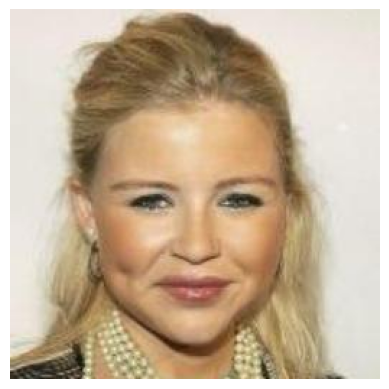

In [79]:
# This cell displays one example of a resized image 

sample_path = list(SAVE_DIR.glob("*.jpg"))[102]
img = Image.open(sample_path)

print(f"Taille : {img.size}") 
plt.imshow(img)
plt.axis('off')
plt.show()

In [80]:
def lambda_schedule(step, warmup_steps=150000, lambda_max=1e-4):
    """Linear warmup for lambda: 0 -> lambda_max"""
    return lambda_max * min(step / warmup_steps, 1.0)

In [81]:
def build_celeba_scalar_dict(attr_txt_path):
    with open(attr_txt_path, "r") as f:
        lines = f.readlines()

    n = int(lines[0].strip())
    attr_names = lines[1].strip().split()

    label_dict = {}
    for line in lines[2:2+n]:
        parts = line.strip().split()
        fname = parts[0]
        vals_pm1 = torch.tensor(list(map(int, parts[1:])), dtype=torch.int8)
        y_scalar_u8 = (vals_pm1 > 0).to(torch.uint8)  # (40,) 0/1
        label_dict[fname] = y_scalar_u8

    return attr_names, label_dict

def scalar_to_onehot80(y_scalar_01):
    # y_scalar_01: (40,) uint8 or float 0/1
    y = y_scalar_01.to(torch.float32)
    y_onehot = torch.empty(80, dtype=torch.float32)
    y_onehot[0::2] = y
    y_onehot[1::2] = 1.0 - y
    return y_onehot

attr_names, celeba_labels = build_celeba_scalar_dict(ATTR_DIR)

In [82]:
# ---- Basic global checks ----
print("=== CelebA LABEL SANITY CHECK ===")
print(f"Number of attributes         : {len(attr_names)}")

# ---- Pick random sample ----
fname = random.choice(list(celeba_labels.keys()))
y_scalar = celeba_labels[fname]           # (40,) uint8
y_onehot = scalar_to_onehot80(y_scalar)   # (80,) float

print("\nRandom sample filename :", fname)
print("y_scalar shape          :", y_scalar.shape)
print("y_onehot shape          :", y_onehot.shape)

# ---- Value checks ----
print("\nUnique values in y_scalar:", torch.unique(y_scalar))
print(y_scalar)
print(y_onehot)
pair_sums = y_onehot[0::2] + y_onehot[1::2]
print("Unique (pair sum) values :", torch.unique(pair_sums))

# ---- Decode attributes ----
active_attrs = [
    attr_names[i]
    for i in range(len(attr_names))
    if y_scalar[i].item() == 1
]

inactive_attrs = [
    attr_names[i]
    for i in range(len(attr_names))
    if y_scalar[i].item() == 0
]

print("\nNumber of active attributes :", len(active_attrs))
print("Active attributes (sample):")
print(active_attrs[:10], "..." if len(active_attrs) > 10 else "")

print("\nInactive attributes (sample):")
print(inactive_attrs[:10], "..." if len(inactive_attrs) > 10 else "")


=== CelebA LABEL SANITY CHECK ===
Number of attributes         : 40

Random sample filename : 098347.jpg
y_scalar shape          : torch.Size([40])
y_onehot shape          : torch.Size([80])

Unique values in y_scalar: tensor([0, 1], dtype=torch.uint8)
tensor([0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0,
        1, 1, 0, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 0], dtype=torch.uint8)
tensor([0., 1., 0., 1., 1., 0., 0., 1., 0., 1., 0., 1., 0., 1., 0., 1., 0., 1.,
        1., 0., 0., 1., 0., 1., 0., 1., 0., 1., 0., 1., 0., 1., 0., 1., 0., 1.,
        1., 0., 1., 0., 0., 1., 0., 1., 0., 1., 0., 1., 1., 0., 1., 0., 0., 1.,
        1., 0., 0., 1., 0., 1., 0., 1., 1., 0., 0., 1., 1., 0., 0., 1., 0., 1.,
        1., 0., 0., 1., 0., 1., 0., 1.])
Unique (pair sum) values : tensor([1.])

Number of active attributes : 10
Active attributes (sample):
['Attractive', 'Blond_Hair', 'Heavy_Makeup', 'High_Cheekbones', 'No_Beard', 'Oval_Face', 'Pointy_Nose', 'Smiling', 'Wavy_Hair', 

In [83]:
IMG_DIR_RESIZED = BASE_DIR / "images" / "celeb_a_resized"          
class CelebA40Resized(Dataset):
    """
    Returns:
      x        : (3,256,256) float in [0,1]
      y_onehot : (80,) float
      y_scalar : (40,) float  (0/1)
    """
    def __init__(self, img_dir_resized, scalar_dict, transform=None):
        self.img_dir = Path(img_dir_resized)
        self.scalar_dict = scalar_dict

        # keep only files that exist in resized folder AND have labels
        files = sorted([f for f in os.listdir(self.img_dir) if f.lower().endswith(".jpg")])
        self.filenames = [f for f in files if f in self.scalar_dict]

        self.transform = transform or transforms.Compose([
            transforms.ToTensor(),  # (3,256,256) float [0,1]
            transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)) # normalizes pixels to -1.0,1.0
        ])

        print("CelebA40Resized dataset size:", len(self.filenames))

    def __len__(self):
        return len(self.filenames)

    def __getitem__(self, idx):
        fname = self.filenames[idx]
        path = self.img_dir / fname

        img = Image.open(path).convert("RGB")
        x = self.transform(img)  # (3,256,256)

        y_scalar_u8 = self.scalar_dict[fname]              # (40,) uint8
        y_scalar = y_scalar_u8.to(torch.float32)           # (40,) float 0/1
        y_onehot = scalar_to_onehot80(y_scalar_u8)         # (80,) float

        return x, y_onehot, y_scalar

In [84]:
BATCH_SIZE = 32
NUM_WORKERS = 2

train_ds = CelebA40Resized(IMG_DIR_RESIZED, celeba_labels)

train_loader = DataLoader(
    train_ds,
    batch_size=BATCH_SIZE,
    shuffle=True,
    num_workers=NUM_WORKERS,
    pin_memory=True
)

# sanity check
x, y_oh, y_sc = next(iter(train_loader))
print("x:", x.shape)       # (B,3,256,256)
print("y_onehot:", y_oh.shape)  # (B,80)
print("y_scalar:", y_sc.shape)  # (B,40)
print("y_scalar unique:", torch.unique(y_sc))
print("pair sums unique:", torch.unique(y_oh[:,0::2] + y_oh[:,1::2]))


CelebA40Resized dataset size: 202599
x: torch.Size([32, 3, 256, 256])
y_onehot: torch.Size([32, 80])
y_scalar: torch.Size([32, 40])
y_scalar unique: tensor([0., 1.])
pair sums unique: tensor([1.])


In [85]:
NUM_ATTR = 40

encoder = Encoder("celeba").to(device)
decoder = Decoder("celeba", num_attributes=NUM_ATTR).to(device)
discriminator = Discriminator(num_attributes=NUM_ATTR).to(device)

lr = 2e-4
opt_E   = optim.Adam(encoder.parameters(), lr=lr, betas=(0.5, 0.999))
opt_Dec = optim.Adam(decoder.parameters(), lr=lr, betas=(0.5, 0.999))
opt_D   = optim.Adam(discriminator.parameters(), lr=lr, betas=(0.5, 0.999))

In [86]:
@torch.no_grad()
def show_fader_attribute_examples(
    encoder,
    decoder,
    loader,
    attr_names,
    device="cuda",
    attr_name="Eyeglasses",
    n_examples=5,
    n_steps=9,
    mode="flip",   # "flip" (current->opposite) or "0to1"
):
    """
    Displays for n_examples:
      - Original
      - Reconstruction (with true y_onehot)
      - Fader slide for ONE attribute (soft interpolation)

    loader batch must yield: (x, y_onehot, y_scalar)
      x: (B,3,256,256)
      y_onehot: (B,80)
      y_scalar: (B,40) 0/1
    """

    assert attr_name in attr_names, f"{attr_name} not in attr_names"
    j = attr_names.index(attr_name)         # attribute index in [0..39]
    pair_idx0, pair_idx1 = 2*j, 2*j + 1     # indices in y_onehot (size 80)

    encoder.eval(); decoder.eval()

    # take one batch
    x, y_onehot, y_scalar = next(iter(loader))
    x = x.to(device)
    y_onehot = y_onehot.to(device)
    y_scalar = y_scalar.to(device)

    # keep first n_examples
    x = x[:n_examples]
    y_onehot = y_onehot[:n_examples]
    y_scalar = y_scalar[:n_examples]

    # encode + recon
    z = encoder(x)
    x_rec = decoder(z, y_onehot)

    # fader steps
    alphas = torch.linspace(0, 1, n_steps, device=device)

    # figure layout: rows=n_examples, cols=2+n_steps
    n_cols = 2 + n_steps
    fig, axes = plt.subplots(n_examples, n_cols, figsize=(2.2*n_cols, 2.6*n_examples), dpi=120)

    if n_examples == 1:
        axes = axes.reshape(1, -1)

    # column titles
    axes[0, 0].set_title("Original", fontsize=11)
    axes[0, 1].set_title("Recon", fontsize=11)
    for k in range(n_steps):
        if mode == "0to1":
            axes[0, 2+k].set_title(f"{attr_name}\nt={alphas[k].item():.2f}", fontsize=10)
        else:
            axes[0, 2+k].set_title(f"{attr_name}\nα={alphas[k].item():.2f}", fontsize=10)

    for i in range(n_examples):
        # show original
        axes[i, 0].imshow(x[i].detach().cpu().permute(1,2,0).clamp(0,1))
        axes[i, 0].axis("off")

        # show recon
        axes[i, 1].imshow(x_rec[i].detach().cpu().permute(1,2,0).clamp(0,1))
        axes[i, 1].axis("off")

        # current value of the attribute (0/1)
        cur = float(y_scalar[i, j].item())

        # choose target
        if mode == "0to1":
            start, target = 0.0, 1.0
        else:  # flip
            start, target = cur, 1.0 - cur

        # build and decode fader images
        for k, a in enumerate(alphas):
            yk = y_onehot[i].clone()

            # interpolate attribute scalar value
            val = (1.0 - a.item()) * start + a.item() * target  # in [0,1]

            # set ONLY this attribute pair (soft one-hot)
            yk[pair_idx0] = 1.0 - val
            yk[pair_idx1] = val

            xk = decoder(z[i:i+1], yk.unsqueeze(0))[0]  # (3,256,256)
            axes[i, 2+k].imshow(xk.detach().cpu().permute(1,2,0).clamp(0,1))
            axes[i, 2+k].axis("off")

        # row label: show current attr value
        axes[i, 0].set_ylabel(f"{attr_name}={int(cur)}", rotation=0, labelpad=35, fontsize=10)

    plt.tight_layout()
    plt.show()

In [87]:
def set_requires_grad(model, flag: bool):
    for p in model.parameters():
        p.requires_grad_(flag)

def train_celeba_fader(
    train_loader,
    encoder,
    decoder,
    discriminator,
    opt_E,
    opt_Dec,
    opt_D,
    attr_names,
    epochs=10,
    device="cuda",
    display_every=1,
    display_attr="Eyeglasses",
    n_display=5,
    n_steps=9,
    display_mode="flip",  # "flip" or "0to1"
):
    global_step = 0

    rec_hist, adv_hist, dis_hist, lam_hist = [], [], [], []

    for epoch in range(1, epochs + 1):
        encoder.train(); decoder.train(); discriminator.train()

        epoch_rec = 0.0
        epoch_adv = 0.0
        epoch_dis = 0.0
        n_batches = 0
        last_lam = None

        pbar = tqdm(train_loader, desc=f"Epoch {epoch}/{epochs}", leave=True)

        for x, y_onehot, y_scalar in pbar:
            x = x.to(device, non_blocking=True)                 # (B,3,256,256)
            y_onehot = y_onehot.to(device, non_blocking=True)   # (B,80)
            y_scalar = y_scalar.to(device, non_blocking=True)   # (B,40)

            # --- lambda schedule (your function) ---
            global_step += 1
            lam = lambda_schedule(global_step)
            last_lam = lam

            # -------------------
            # (1) Update Discriminator
            # -------------------
            set_requires_grad(discriminator, True)
            opt_D.zero_grad(set_to_none=True)

            loss_D = discriminator_loss(encoder, discriminator, x, y_scalar)  # y_scalar (B,40)
            loss_D.backward()
            opt_D.step()

            # -------------------
            # (2) Update Encoder + Decoder (freeze D)
            # -------------------
            set_requires_grad(discriminator, False)
            opt_E.zero_grad(set_to_none=True)
            opt_Dec.zero_grad(set_to_none=True)

            loss_ED, parts = adversarial_loss(
                encoder=encoder,
                decoder=decoder,
                discriminator=discriminator,
                x=x,
                y_onehot=y_onehot,
                y_bin=y_scalar,                         # (B,40)
                lambda_E=lam,
                reconstruction_loss_fn=reconstruction_loss,
            )
            loss_ED.backward()
            opt_E.step()
            opt_Dec.step()

            # --- logging ---
            rec = float(parts["recon"].detach())
            adv = float(parts["adv"].detach())
            dis = float(loss_D.detach())

            epoch_rec += rec
            epoch_adv += adv
            epoch_dis += dis
            n_batches += 1

            pbar.set_postfix({
                "L_rec": f"{rec:.4f}",
                "L_adv": f"{adv:.4f}",
                "L_dis": f"{dis:.4f}",
                "lam":   f"{lam:.2e}",
                "step":  f"{global_step}"
            })

        # ---- epoch averages ----
        avg_rec = epoch_rec / n_batches
        avg_adv = epoch_adv / n_batches
        avg_dis = epoch_dis / n_batches

        rec_hist.append(avg_rec)
        adv_hist.append(avg_adv)
        dis_hist.append(avg_dis)
        lam_hist.append(last_lam)

        print(
            f"[Epoch {epoch:03d}/{epochs}] "
            f"L_rec={avg_rec:.4f} | L_adv={avg_adv:.4f} | L_dis={avg_dis:.4f} | lam={last_lam:.2e}"
        )

        # ---- display (Original | Recon | Fader) ----
        if epoch % 10 == 0:
            show_fader_attribute_examples(
                encoder=encoder,
                decoder=decoder,
                loader=train_loader,
                attr_names=attr_names,
                device=device,
                attr_name=display_attr,
                n_examples=n_display,
                n_steps=n_steps,
                mode=display_mode,
            )

    return encoder, decoder, discriminator, rec_hist, adv_hist, dis_hist, lam_hist


Epoch 1/36: 100%|██████████| 6332/6332 [17:34<00:00,  6.00it/s, L_rec=0.0245, L_adv=2.9262, L_dis=0.3308, lam=4.22e-06, step=6332]


[Epoch 001/36] L_rec=0.0346 | L_adv=2.9704 | L_dis=0.3129 | lam=4.22e-06


Epoch 2/36: 100%|██████████| 6332/6332 [17:34<00:00,  6.00it/s, L_rec=0.0265, L_adv=3.5063, L_dis=0.3059, lam=8.44e-06, step=12664]


[Epoch 002/36] L_rec=0.0200 | L_adv=3.5563 | L_dis=0.2804 | lam=8.44e-06


Epoch 3/36: 100%|██████████| 6332/6332 [17:33<00:00,  6.01it/s, L_rec=0.0107, L_adv=3.7416, L_dis=0.2465, lam=1.27e-05, step=18996]


[Epoch 003/36] L_rec=0.0169 | L_adv=3.7813 | L_dis=0.2713 | lam=1.27e-05


Epoch 4/36: 100%|██████████| 6332/6332 [17:33<00:00,  6.01it/s, L_rec=0.0275, L_adv=3.8085, L_dis=0.2414, lam=1.69e-05, step=25328]


[Epoch 004/36] L_rec=0.0151 | L_adv=3.9174 | L_dis=0.2657 | lam=1.69e-05


Epoch 5/36: 100%|██████████| 6332/6332 [17:33<00:00,  6.01it/s, L_rec=0.0104, L_adv=3.7587, L_dis=0.2923, lam=2.11e-05, step=31660]


[Epoch 005/36] L_rec=0.0140 | L_adv=4.0252 | L_dis=0.2617 | lam=2.11e-05


Epoch 6/36: 100%|██████████| 6332/6332 [17:32<00:00,  6.02it/s, L_rec=0.0198, L_adv=3.5288, L_dis=0.2586, lam=2.53e-05, step=37992]


[Epoch 006/36] L_rec=0.0131 | L_adv=4.0697 | L_dis=0.2589 | lam=2.53e-05


Epoch 7/36: 100%|██████████| 6332/6332 [17:38<00:00,  5.98it/s, L_rec=0.0253, L_adv=3.3222, L_dis=0.2925, lam=2.95e-05, step=44324]


[Epoch 007/36] L_rec=0.0124 | L_adv=4.0954 | L_dis=0.2570 | lam=2.95e-05


Epoch 8/36: 100%|██████████| 6332/6332 [17:40<00:00,  5.97it/s, L_rec=0.0134, L_adv=3.8993, L_dis=0.2747, lam=3.38e-05, step=50656]


[Epoch 008/36] L_rec=0.0119 | L_adv=4.1001 | L_dis=0.2557 | lam=3.38e-05


Epoch 9/36: 100%|██████████| 6332/6332 [17:34<00:00,  6.00it/s, L_rec=0.0141, L_adv=3.9680, L_dis=0.2244, lam=3.80e-05, step=56988]


[Epoch 009/36] L_rec=0.0114 | L_adv=4.1011 | L_dis=0.2546 | lam=3.80e-05


Epoch 10/36: 100%|██████████| 6332/6332 [17:32<00:00,  6.01it/s, L_rec=0.0118, L_adv=3.7315, L_dis=0.2790, lam=4.22e-05, step=63320]

[Epoch 010/36] L_rec=0.0110 | L_adv=4.1124 | L_dis=0.2540 | lam=4.22e-05


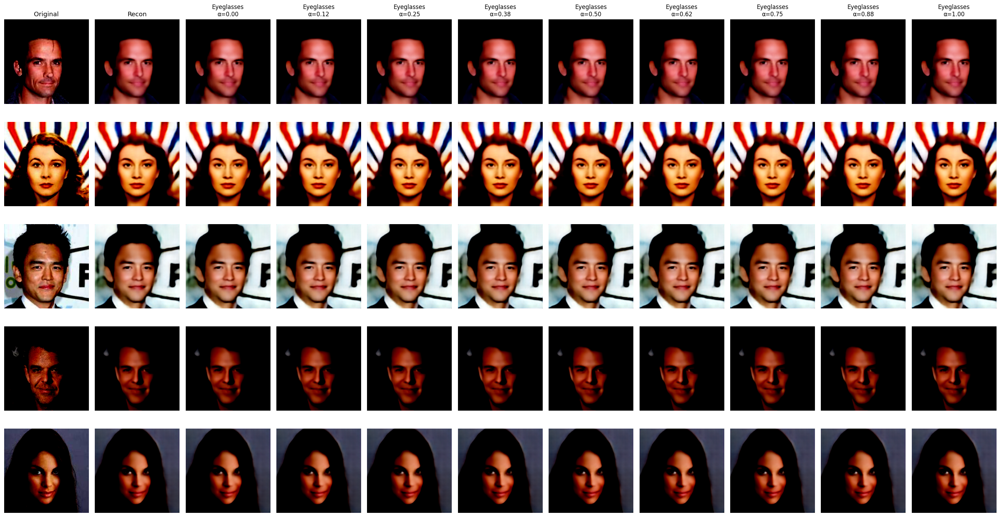

Epoch 11/36: 100%|██████████| 6332/6332 [17:32<00:00,  6.01it/s, L_rec=0.0119, L_adv=4.1859, L_dis=0.2944, lam=4.64e-05, step=69652]


[Epoch 011/36] L_rec=0.0106 | L_adv=4.0969 | L_dis=0.2539 | lam=4.64e-05


Epoch 12/36: 100%|██████████| 6332/6332 [17:33<00:00,  6.01it/s, L_rec=0.0182, L_adv=3.9094, L_dis=0.2431, lam=5.07e-05, step=75984]


[Epoch 012/36] L_rec=0.0103 | L_adv=4.0906 | L_dis=0.2535 | lam=5.07e-05


Epoch 13/36: 100%|██████████| 6332/6332 [17:33<00:00,  6.01it/s, L_rec=0.0124, L_adv=3.7591, L_dis=0.2805, lam=5.49e-05, step=82316]


[Epoch 013/36] L_rec=0.0100 | L_adv=4.0863 | L_dis=0.2537 | lam=5.49e-05


Epoch 14/36: 100%|██████████| 6332/6332 [17:33<00:00,  6.01it/s, L_rec=0.0115, L_adv=3.4185, L_dis=0.2287, lam=5.91e-05, step=88648]


[Epoch 014/36] L_rec=0.0097 | L_adv=4.0755 | L_dis=0.2534 | lam=5.91e-05


Epoch 15/36: 100%|██████████| 6332/6332 [17:34<00:00,  6.00it/s, L_rec=0.0150, L_adv=3.2785, L_dis=0.4374, lam=6.33e-05, step=94980]


[Epoch 015/36] L_rec=0.0095 | L_adv=4.0594 | L_dis=0.2541 | lam=6.33e-05


Epoch 16/36: 100%|██████████| 6332/6332 [17:33<00:00,  6.01it/s, L_rec=0.0110, L_adv=3.4026, L_dis=0.2358, lam=6.75e-05, step=101312]


[Epoch 016/36] L_rec=0.0093 | L_adv=4.0455 | L_dis=0.2542 | lam=6.75e-05


Epoch 17/36: 100%|██████████| 6332/6332 [17:31<00:00,  6.02it/s, L_rec=0.0165, L_adv=3.8444, L_dis=0.2140, lam=7.18e-05, step=107644]


[Epoch 017/36] L_rec=0.0092 | L_adv=4.0558 | L_dis=0.2540 | lam=7.18e-05


Epoch 18/36: 100%|██████████| 6332/6332 [17:31<00:00,  6.02it/s, L_rec=0.0087, L_adv=3.4395, L_dis=0.3291, lam=7.60e-05, step=113976]


[Epoch 018/36] L_rec=0.0090 | L_adv=4.0378 | L_dis=0.2547 | lam=7.60e-05


Epoch 19/36: 100%|██████████| 6332/6332 [17:31<00:00,  6.02it/s, L_rec=0.0109, L_adv=3.6275, L_dis=0.2143, lam=8.02e-05, step=120308]


[Epoch 019/36] L_rec=0.0089 | L_adv=4.0067 | L_dis=0.2557 | lam=8.02e-05


Epoch 20/36: 100%|██████████| 6332/6332 [17:32<00:00,  6.02it/s, L_rec=0.0117, L_adv=3.3543, L_dis=0.2791, lam=8.44e-05, step=126640]

[Epoch 020/36] L_rec=0.0088 | L_adv=4.0040 | L_dis=0.2558 | lam=8.44e-05


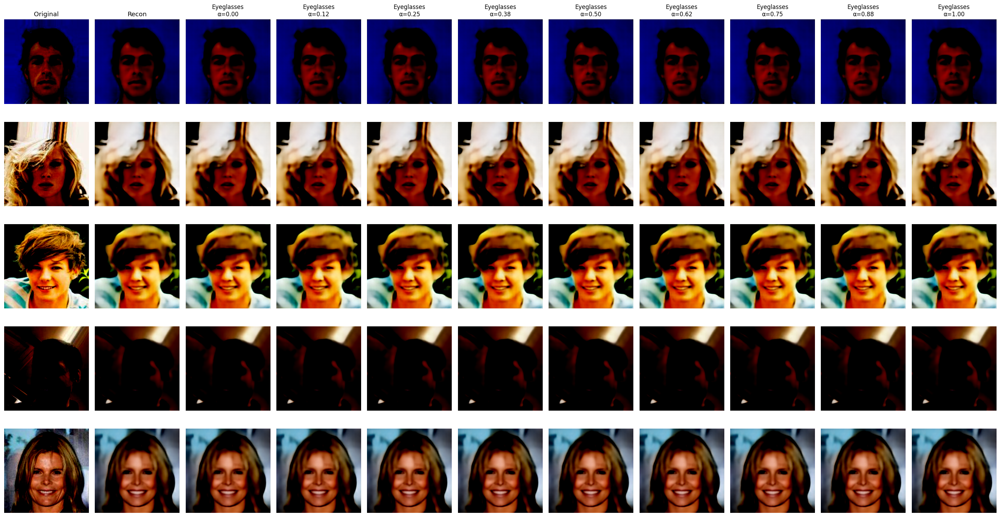

Epoch 21/36: 100%|██████████| 6332/6332 [17:31<00:00,  6.02it/s, L_rec=0.0088, L_adv=3.1948, L_dis=0.2577, lam=8.86e-05, step=132972]


[Epoch 021/36] L_rec=0.0087 | L_adv=3.9905 | L_dis=0.2562 | lam=8.86e-05


Epoch 22/36: 100%|██████████| 6332/6332 [17:30<00:00,  6.02it/s, L_rec=0.0131, L_adv=4.4332, L_dis=0.2275, lam=9.29e-05, step=139304]


[Epoch 022/36] L_rec=0.0086 | L_adv=3.9640 | L_dis=0.2573 | lam=9.29e-05


Epoch 23/36: 100%|██████████| 6332/6332 [17:31<00:00,  6.02it/s, L_rec=0.0136, L_adv=3.6084, L_dis=0.2709, lam=9.71e-05, step=145636]


[Epoch 023/36] L_rec=0.0085 | L_adv=3.9509 | L_dis=0.2579 | lam=9.71e-05


Epoch 24/36: 100%|██████████| 6332/6332 [17:30<00:00,  6.03it/s, L_rec=0.0148, L_adv=3.4500, L_dis=0.3184, lam=1.00e-04, step=151968]


[Epoch 024/36] L_rec=0.0084 | L_adv=3.9425 | L_dis=0.2580 | lam=1.00e-04


Epoch 25/36: 100%|██████████| 6332/6332 [17:30<00:00,  6.03it/s, L_rec=0.0162, L_adv=2.8255, L_dis=0.3465, lam=1.00e-04, step=158300]


[Epoch 025/36] L_rec=0.0083 | L_adv=3.9269 | L_dis=0.2590 | lam=1.00e-04


Epoch 26/36: 100%|██████████| 6332/6332 [17:31<00:00,  6.02it/s, L_rec=0.0087, L_adv=4.0053, L_dis=0.2364, lam=1.00e-04, step=164632]


[Epoch 026/36] L_rec=0.0082 | L_adv=3.9408 | L_dis=0.2582 | lam=1.00e-04


Epoch 27/36: 100%|██████████| 6332/6332 [17:32<00:00,  6.02it/s, L_rec=0.0075, L_adv=3.4751, L_dis=0.2755, lam=1.00e-04, step=170964]


[Epoch 027/36] L_rec=0.0081 | L_adv=3.9288 | L_dis=0.2585 | lam=1.00e-04


Epoch 28/36: 100%|██████████| 6332/6332 [17:32<00:00,  6.02it/s, L_rec=0.0101, L_adv=3.6814, L_dis=0.3570, lam=1.00e-04, step=177296]


[Epoch 028/36] L_rec=0.0080 | L_adv=3.9404 | L_dis=0.2583 | lam=1.00e-04


Epoch 29/36: 100%|██████████| 6332/6332 [17:30<00:00,  6.03it/s, L_rec=0.0109, L_adv=3.8188, L_dis=0.2550, lam=1.00e-04, step=183628]


[Epoch 029/36] L_rec=0.0080 | L_adv=3.9373 | L_dis=0.2581 | lam=1.00e-04


Epoch 30/36: 100%|██████████| 6332/6332 [17:31<00:00,  6.02it/s, L_rec=0.0111, L_adv=3.7012, L_dis=0.2898, lam=1.00e-04, step=189960]

[Epoch 030/36] L_rec=0.0079 | L_adv=3.9406 | L_dis=0.2581 | lam=1.00e-04


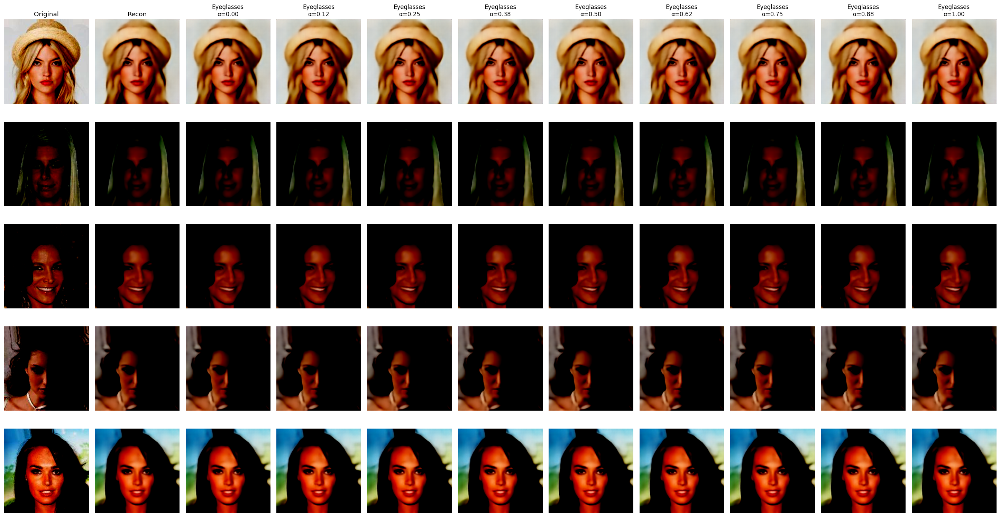

Epoch 31/36: 100%|██████████| 6332/6332 [17:30<00:00,  6.03it/s, L_rec=0.0144, L_adv=2.9946, L_dis=0.2961, lam=1.00e-04, step=196292]


[Epoch 031/36] L_rec=0.0078 | L_adv=3.9451 | L_dis=0.2575 | lam=1.00e-04


Epoch 32/36: 100%|██████████| 6332/6332 [17:32<00:00,  6.02it/s, L_rec=0.0235, L_adv=3.8186, L_dis=0.3675, lam=1.00e-04, step=202624]


[Epoch 032/36] L_rec=0.0078 | L_adv=3.9420 | L_dis=0.2578 | lam=1.00e-04


Epoch 33/36: 100%|██████████| 6332/6332 [17:32<00:00,  6.02it/s, L_rec=0.0107, L_adv=3.2460, L_dis=0.3883, lam=1.00e-04, step=208956]


[Epoch 033/36] L_rec=0.0077 | L_adv=3.9395 | L_dis=0.2576 | lam=1.00e-04


Epoch 34/36: 100%|██████████| 6332/6332 [17:32<00:00,  6.02it/s, L_rec=0.0138, L_adv=3.8024, L_dis=0.2502, lam=1.00e-04, step=215288]


[Epoch 034/36] L_rec=0.0077 | L_adv=3.9343 | L_dis=0.2576 | lam=1.00e-04


Epoch 35/36: 100%|██████████| 6332/6332 [17:32<00:00,  6.02it/s, L_rec=0.0088, L_adv=3.3114, L_dis=0.2557, lam=1.00e-04, step=221620]


[Epoch 035/36] L_rec=0.0076 | L_adv=3.9477 | L_dis=0.2573 | lam=1.00e-04


Epoch 36/36: 100%|██████████| 6332/6332 [12:36<00:00,  8.37it/s, L_rec=0.0124, L_adv=3.7322, L_dis=0.3110, lam=1.00e-04, step=227952]

[Epoch 036/36] L_rec=0.0075 | L_adv=3.9420 | L_dis=0.2571 | lam=1.00e-04


In [88]:
# Training

encoder, decoder, discriminator, rec_hist, adv_hist, dis_hist, lam_hist = train_celeba_fader(
    train_loader=train_loader,
    encoder=encoder,
    decoder=decoder,
    discriminator=discriminator,
    opt_E=opt_E,
    opt_Dec=opt_Dec,
    opt_D=opt_D,
    attr_names=attr_names,
    epochs=36,
    device=device,
    display_every=1,             # show every epoch (change to 5 if slow)
    display_attr="Eyeglasses",   # chosen attribute
    n_display=5,
    n_steps=9,
    display_mode="flip"          # or "0to1"
)


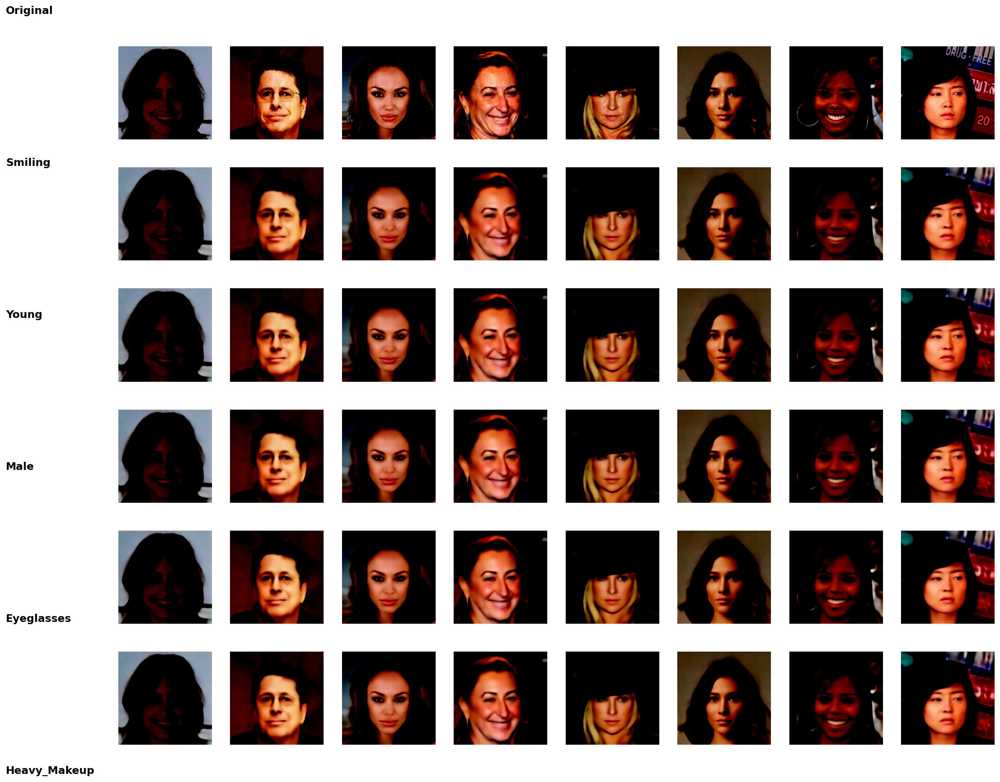

In [89]:
@torch.no_grad()
def show_attribute_grid_y1(
    encoder,
    decoder,
    loader,
    attr_names,
    device="cuda",
    n_photos=5,
    attrs_to_show=None,
):
    encoder.eval(); decoder.eval()

    # ---- load batch ----
    x, y_onehot, y_scalar = next(iter(loader))
    x = x[:n_photos].to(device)
    y_onehot = y_onehot[:n_photos].to(device)

    if attrs_to_show is None:
        attrs_to_show = [
            "Smiling",
            "Young",
            "Male",
            "Mouth_Slightly_Open",
            "Heavy_Makeup",
        ]

    z = encoder(x)

    n_rows = 1 + len(attrs_to_show)
    n_cols = n_photos

    fig, axes = plt.subplots(
        n_rows,
        n_cols,
        figsize=(2.4 * n_cols, 2.6 * n_rows),
        dpi=130
    )

    # ensure axes is 2D
    if n_rows == 1:
        axes = axes.reshape(1, -1)
    if n_cols == 1:
        axes = axes.reshape(-1, 1)

    # =========================
    # Row 0 — Original
    # =========================
    for c in range(n_cols):
        axes[0, c].imshow(x[c].cpu().permute(1,2,0).clamp(0,1))
        axes[0, c].axis("off")

    # =========================
    # Attribute rows
    # =========================
    for r, attr in enumerate(attrs_to_show, start=1):
        j = attr_names.index(attr)
        i0, i1 = 2*j, 2*j + 1

        for c in range(n_cols):
            y_mod = y_onehot[c].clone()
            y_mod[i0] = 0.0
            y_mod[i1] = 1.0

            x_mod = decoder(z[c:c+1], y_mod.unsqueeze(0))[0]
            axes[r, c].imshow(x_mod.cpu().permute(1,2,0).clamp(0,1))
            axes[r, c].axis("off")

    # =========================
    # LEFT TEXT LABELS (KEY FIX)
    # =========================
    row_labels = ["Original"] + attrs_to_show

    for r, label in enumerate(row_labels):
        y = 1 - (r + 0.5) / n_rows   # vertical position in figure coords
        fig.text(
            0.02, y, label,
            va="center",
            ha="left",
            fontsize=13,
            weight="bold"
        )

    plt.subplots_adjust(left=0.12, hspace=0.25)
    plt.show()


# ---- RUN ----
attrs = ["Smiling", "Young", "Male", "Eyeglasses", "Heavy_Makeup"]

show_attribute_grid_y1(
    encoder=encoder,
    decoder=decoder,
    loader=train_loader,
    attr_names=attr_names,
    device=device,
    n_photos=8,
    attrs_to_show=attrs
)


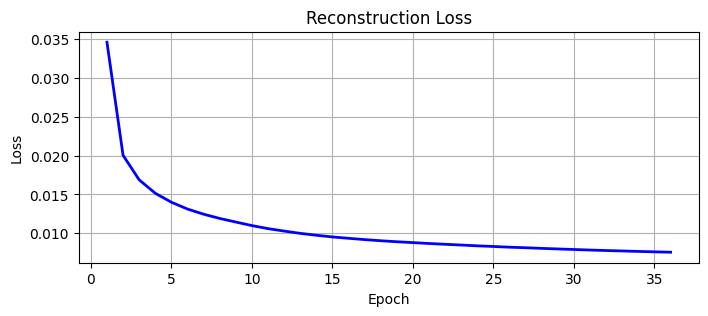

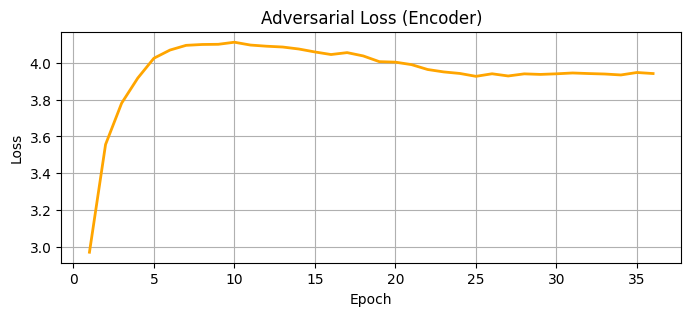

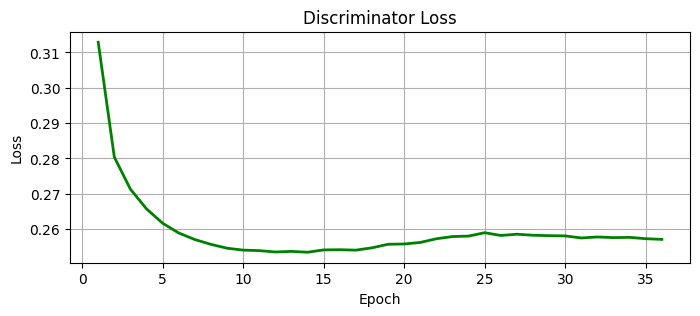

In [90]:
import matplotlib.pyplot as plt

def plot_fader_losses(rec_losses, adv_losses, disc_losses):
    epochs = range(1, len(rec_losses) + 1)

    # --- Reconstruction ---
    plt.figure(figsize=(8, 3))
    plt.plot(epochs, rec_losses, linewidth=2, color='blue')
    plt.title("Reconstruction Loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.grid(True)
    plt.show()

    # --- Adversarial (Encoder) ---
    plt.figure(figsize=(8, 3))
    plt.plot(epochs, adv_losses, linewidth=2, color='orange')
    plt.title("Adversarial Loss (Encoder)")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.grid(True)
    plt.show()

    # --- Discriminator ---
    plt.figure(figsize=(8, 3))
    plt.plot(epochs, disc_losses, linewidth=2, color='green')
    plt.title("Discriminator Loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.grid(True)
    plt.show()


plot_fader_losses(rec_hist, adv_hist, dis_hist)
